# Task 4: Image Super Resolution with RRF features.

In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt
import cv2

import numpy as np
import pandas as pd
import torch.nn as nn

# the gridspec module provides a flexible way to create complex grid layouts for arranging subplots in a figure.
import matplotlib.gridspec as gridspec
from sklearn.preprocessing import MinMaxScaler
import os

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
# os.environ['CUDA_LAUNCH_BLOCKING'] = '1': This line sets an 
# environment variable that makes CUDA operations synchronous.
#  Specifically, it ensures that all CUDA kernels 
# (operations executed on the GPU) are completed before moving 
# on to the next line of code. This is the effect of setting 
# CUDA_LAUNCH_BLOCKING to 1.

import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

# Retina display
%config InlineBackend.figure_format = 'retina'

# einops is a Python library that provides a concise and readable 
# way to perform complex tensor operations, such as reshaping, rearranging, and reducing dimensions.
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Downloading the image file
import os

url = 'https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg'
file_name = 'img.jpg'

# Check if the file already exists
if os.path.exists(file_name):
    print(f'{file_name} already exists')
else:
    # Use wget to download the file
    os.system(f'wget {url} -O {file_name}')
    print(f'{file_name} downloaded')


--2024-09-14 06:05:31--  https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg
Resolving segment-anything.com (segment-anything.com)... 13.35.7.12, 13.35.7.124, 13.35.7.36, ...
Connecting to segment-anything.com (segment-anything.com)|13.35.7.12|:443... connected.
HTTP request sent, awaiting response... 

img.jpg downloaded


200 OK
Length: 221810 (217K) [image/jpeg]
Saving to: 'img.jpg'

     0K .......... .......... .......... .......... .......... 23% 4.78M 0s
    50K .......... .......... .......... .......... .......... 46% 43.5M 0s
   100K .......... .......... .......... .......... .......... 69% 22.6M 0s
   150K .......... .......... .......... .......... .......... 92% 42.9M 0s
   200K .......... ......                                     100% 44.3M=0.01s

2024-09-14 06:05:32 (14.1 MB/s) - 'img.jpg' saved [221810/221810]



In [3]:
# Downloading the image file using urllib
import os
import urllib.request

url = 'https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg'
file_name = 'img.jpg'

# Check if the file already exists
if os.path.exists(file_name):
    print(f'{file_name} already exists')
else:
    # Download the file using urllib
    urllib.request.urlretrieve(url, file_name)
    print(f'{file_name} downloaded')


img.jpg already exists


In [60]:
def processImg(img_url,filename,scale,coords = [600,800],showimg = False):
    
    # Check if the file already exists
    if os.path.exists(filename):
        print(f'{filename} already exists')
    else:
        # Use wget to download the file
        os.system(f'wget {img_url} -O {filename}')
        print(f'{filename} downloaded')
        

    img = torchvision.io.read_image(filename)
    
    if showimg == True:
        plt.imshow(rearrange(img,'c h w -> h w c'))
        plt.show()

    scaler_img = MinMaxScaler().fit(img.reshape(-1, 1))

    img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)

    img_scaled = torch.tensor(img_scaled)

    img_scaled = img_scaled.to(device)

    crop = torchvision.transforms.functional.crop(img_scaled.cpu(), coords[0], coords[1], 200, 200)

    crop = crop.to(device)

    scaler = MinMaxScaler()
    img_scaled = scaler.fit_transform(crop.cpu().reshape(-1,1)).reshape(crop.shape)
    img_scaled = torch.tensor(img_scaled).to(device)

    img = crop.cpu().numpy()

    img = img.transpose(1, 2, 0)

    resized_img = cv2.resize(img, (200//scale, 200//scale))

    resized_tensor = torch.from_numpy(resized_img).permute(2, 0, 1)

    return crop,resized_tensor

    


In [5]:
# Importing and processing the image using torch vision and cv2

img = torchvision.io.read_image('img.jpg')
print(img.shape)


torch.Size([3, 1365, 2048])


In [6]:
scaler_img = MinMaxScaler().fit(img.reshape(-1, 1))

img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)

display(img_scaled.shape)

img_scaled = torch.tensor(img_scaled)

img_scaled = img_scaled.to(device)

(3, 1365, 2048)

torch.Size([3, 200, 200])


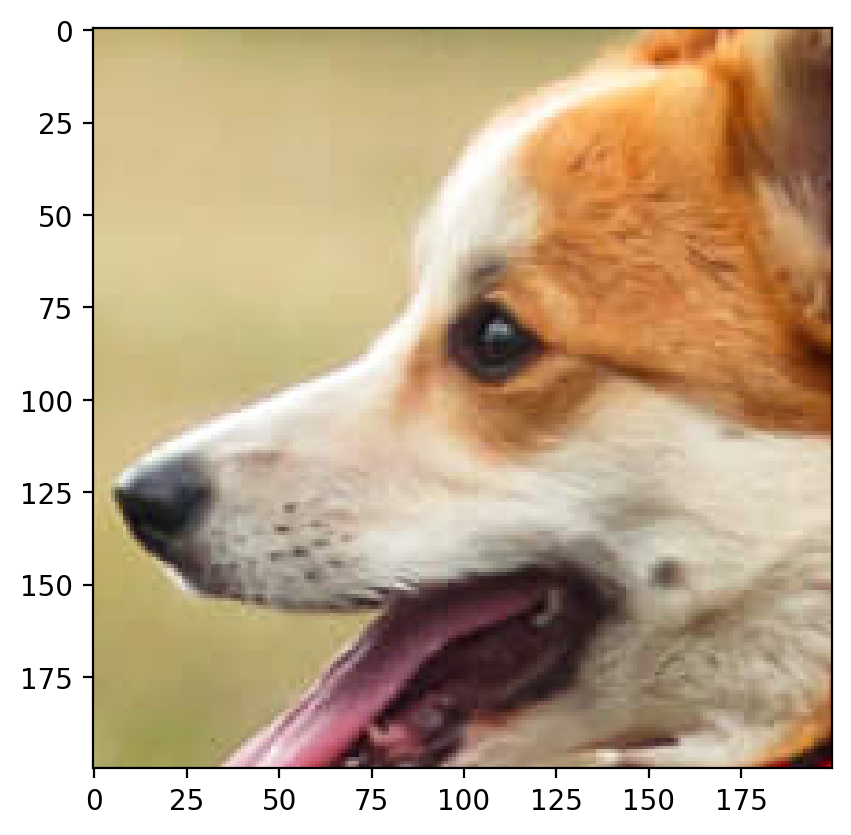

In [7]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 200, 200)
print(crop.shape)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
crop = crop.to(device)

Shape of scaled Image torch.Size([3, 200, 200])


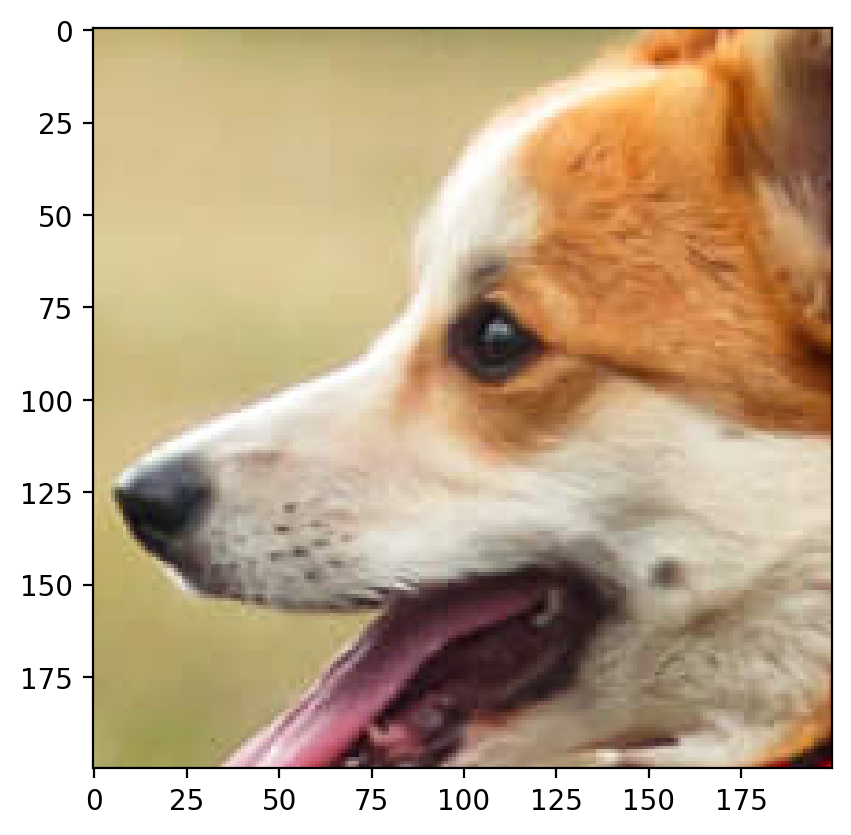

In [8]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
img_scaled = scaler.fit_transform(crop.cpu().reshape(-1,1)).reshape(crop.shape)
img_scaled = torch.tensor(img_scaled).to(device)
print("Shape of scaled Image",img_scaled.shape)
plt.imshow(rearrange(img_scaled.cpu(), 'c h w -> h w c').cpu().numpy())

torch.Size([3, 100, 100])


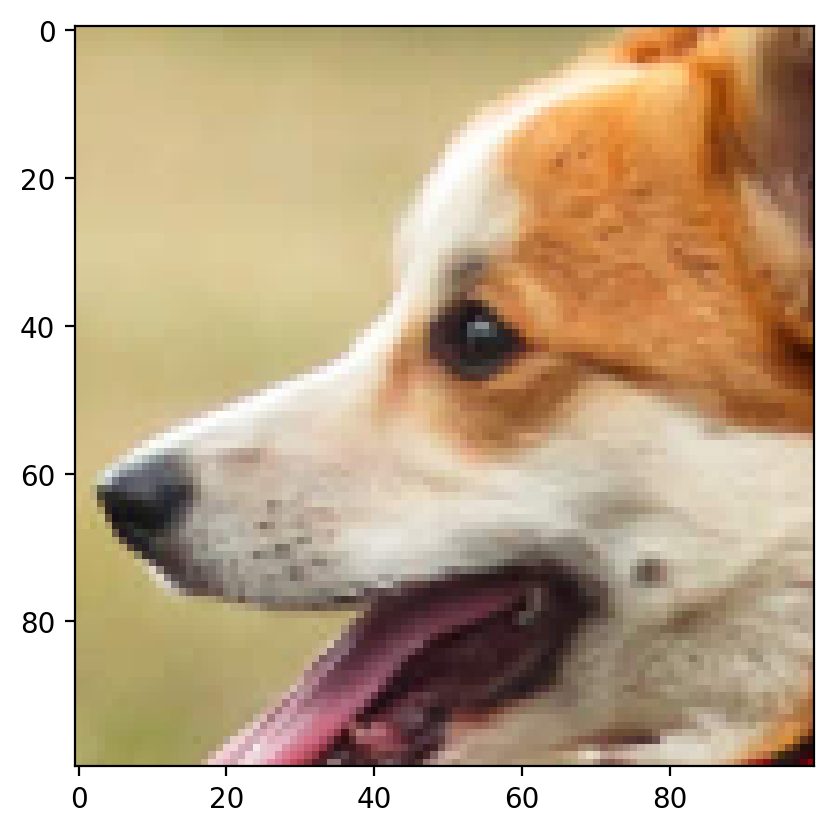

In [9]:
img = crop.cpu().numpy()

img = img.transpose(1, 2, 0)

resized_img = cv2.resize(img, (100, 100))

plt.imshow(resized_img)

resized_tensor = torch.from_numpy(resized_img).permute(2, 0, 1)

print(resized_tensor.shape) 


## Que: 1 
Super-resolution: Perform superresolution on the image shown in notebook to enhance its resolution by factor 2. Show a qualitative comparison of original and reconstructed image. (i.e display original image and the image you created side by side)

In [10]:
def train(net, lr, X, Y, epochs, device='cuda', verbose=True):

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)

    # Ensuring that all the tensors are on same device
    X = X.to(device)
    Y = Y.to(device)
    net = net.to(device)

    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)

        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    
    return loss.item()


In [11]:
from sklearn.kernel_approximation import RBFSampler

def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2),random_state = 42)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)


In [12]:
def create_coordinate_map(img, scale=1):

    num_channels, height, width = img.shape

    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [13]:
def plot_reconstructed_and_original_image(original_img, net, X,scale, title=""):
    """
    Function to plot the reconstructed image (output of a neural network) alongside the original image.

    Parameters:
    original_img: torch.Tensor
        The original image tensor of shape (num_channels, height, width).
    net: torch.nn.Module
        The trained neural network model used to reconstruct the image.
    X: torch.Tensor
        Input tensor to the network of shape (num_samples, in_features).
    title: str, optional (default="")
        Title for the entire figure.
    """

    # Extract the dimensions of the original image (number of channels, height, and width)
    num_channels, height, width = original_img.shape

    # Set the model to evaluation mode; this turns off dropout and batch normalization layers if present
    net.eval()

    # Temporarily disable gradient calculation to speed up computation and reduce memory usage
    with torch.no_grad():
        # Get the reconstructed output from the model by passing input tensor X
        outputs = net(X)

        # Reshape the output to match the original image dimensions (height, width, num_channels)
        outputs = outputs.reshape(scale*height, scale*width, num_channels)
        # outputs = outputs.permute(1, 2, 0)  # Uncomment if you need to change the channel order for visualization

    # Create a new figure with a specific size
    fig = plt.figure(figsize=(6, 4))

    # Create a GridSpec layout to place subplots in a grid; here, it's a 1x2 grid with equal width ratios
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
    # display(gs)

    # Define the subplots within the GridSpec layout
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    # Display the reconstructed image in the first subplot (ax0)
    # .cpu() moves the tensor to CPU if it's on GPU, which is necessary for matplotlib
    ax0.imshow(outputs.cpu())
    ax0.set_title("Upscaled Image")  # Set the title for the first subplot

    # Display the original image in the second subplot (ax1)
    # .permute(1, 2, 0) changes the channel order to (height, width, num_channels) for proper visualization in matplotlib
    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Blurr Image")  # Set the title for the second subplot

    # Turn off the axes for both subplots to improve visualization
    for a in [ax0, ax1]:
        a.axis("off")

    # Set a super title for the entire figure and adjust the layout to minimize overlap
    fig.suptitle(title, y=0.9)
    plt.tight_layout()
    
    return outputs



In [14]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)


In [15]:
import torch.nn.functional as F

# Define a ComplexModel class that inherits from nn.Module
class ComplexModel(nn.Module):
    def __init__(self, in_features, out_features, hidden_units=128, num_layers=4):
        super(ComplexModel, self).__init__()
        
        # Define the input layer
        self.input_layer = nn.Linear(in_features, hidden_units)
        
        # Define hidden layers
        self.hidden_layers = nn.ModuleList([
            nn.Linear(hidden_units, hidden_units) for _ in range(num_layers)
        ])
        
        # Define the output layer
        self.output_layer = nn.Linear(hidden_units, out_features)
    
    def forward(self, x):
        # Pass through the input layer and apply ReLU activation
        x = F.relu(self.input_layer(x))
        
        # Pass through each hidden layer with ReLU activation
        for layer in self.hidden_layers:
            x = F.relu(layer(x))
        
        # Pass through the output layer (no activation here)
        x = self.output_layer(x)
        
        return x


In [16]:
import torch.nn as nn
import torch.nn.functional as F

class CNNModel(nn.Module):
    def __init__(self, in_channels=2, out_channels=3, num_features=64):
        """
        in_channels: int
            The number of input channels (e.g., 2 for x and y coordinates).
        out_channels: int
            The number of output channels (e.g., 3 for RGB image).
        num_features: int
            The number of features for the convolutional layers.
        """
        super(CNNModel, self).__init__()
        
        # First convolutional layer
        self.conv1 = nn.Conv2d(in_channels, num_features, kernel_size=3, padding=1)
        
        # Additional convolutional layers
        self.conv2 = nn.Conv2d(num_features, num_features, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(num_features, num_features, kernel_size=3, padding=1)
        
        # Output layer
        self.conv4 = nn.Conv2d(num_features, out_channels, kernel_size=3, padding=1)
    
    def forward(self, x):
        # Apply first convolutional layer followed by ReLU activation
        x = F.relu(self.conv1(x))
        
        # Apply additional convolutional layers followed by ReLU activation
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        
        # Apply the output layer (no activation)
        x = self.conv4(x)
        
        return x


In [17]:
n_features = 30000
sigma = 0.03

In [18]:
X_resized, Y_resized = create_coordinate_map(resized_tensor, scale=1)

scaler_X = MinMaxScaler(feature_range=(-1, 1)).fit(X_resized.cpu())

X_scaled = scaler_X.transform(X_resized.cpu())

X_scaled = torch.tensor(X_scaled).to(device)

X_scaled = X_scaled.float()

X_rff = create_rff_features(X_scaled, n_features, sigma)

print(X_rff.shape)
print(X_scaled.shape)

net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.005, X_rff, Y_resized, 2500, device)


torch.Size([10000, 30000])
torch.Size([10000, 2])
Epoch 0 loss: 0.411383
Epoch 100 loss: 0.011495
Epoch 200 loss: 0.000529
Epoch 300 loss: 0.000387
Epoch 400 loss: 0.000355
Epoch 500 loss: 0.000334
Epoch 600 loss: 0.000321
Epoch 700 loss: 0.000312
Epoch 800 loss: 0.000305
Epoch 900 loss: 0.000300
Epoch 1000 loss: 0.000296
Epoch 1100 loss: 0.000293
Epoch 1200 loss: 0.000291
Epoch 1300 loss: 0.000289
Epoch 1400 loss: 0.000288
Epoch 1500 loss: 0.000286
Epoch 1600 loss: 0.000285
Epoch 1700 loss: 0.000284
Epoch 1800 loss: 0.000283
Epoch 1900 loss: 0.000282
Epoch 2000 loss: 0.000282
Epoch 2100 loss: 0.000281
Epoch 2200 loss: 0.000280
Epoch 2300 loss: 0.000280
Epoch 2400 loss: 0.000279


0.00027892799698747694

In [19]:
# comp = ComplexModel(X_rff.shape[1], 3)
# comp.to(device)

# train(comp, 0.005, X_rff, Y_resized, 2500,"cuda")

In [20]:
# # Assuming 'device' is either 'cuda' or 'cpu'
# cnn_net = CNNModel(in_channels=2, out_channels=3, num_features=64)  # Initialize the CNN model
# cnn_net.to(device)  # Move the model to the desired device

# # Reshape X_rrf to match the input dimensions expected by the CNN (N, C, H, W)
# # Assuming X_rrf is of shape (height * width, in_features)
# height, width = int(crop.shape[1]), int(crop.shape[2])
# X_rrf_reshaped = X_rff.view(1, 2, height, width)  # Add batch dimension (N=1) and channel dimension (C=2)
# Y_reshaped = Y.view(1, 3, height, width)  # Add batch dimension (N=1) and channel dimension (C=3)

# # Train the CNN model
# final_loss = train(cnn_net, 0.001, X_rrf_reshaped.to(device), Y_reshaped.to(device), 2500, verbose=True)

# print(f"Final training loss: {final_loss}")


In [21]:
from sklearn import preprocessing
import torch

# Define the scale factor
scale = 2

# Create coordinate map with resized tensor
X, Y = create_coordinate_map(resized_tensor, scale)

# MinMaxScaler to scale from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(X.cpu())

# Scale the X coordinates
X_scaled = scaler_X.transform(X.cpu())

# Move the scaled X coordinates to the GPU
X_scaled = torch.tensor(X_scaled).to(device)

# Set dtype to float32
X_scaled = X_scaled.float()

# Generate RFF features from the scaled X coordinates
X_rff_new = create_rff_features(X_scaled, n_features, sigma)

# Print information for debugging
print("X_scaled:")
print(X_scaled)
print("X_rff_new:")
print(X_rff_new)
print("X_rff_new shape:")
print(X_rff_new.shape)
print("X_rff:")
print(X_rff)


X_scaled:
tensor([[-1.0000, -1.0000],
        [-1.0000, -0.9899],
        [-1.0000, -0.9799],
        ...,
        [ 1.0000,  0.9799],
        [ 1.0000,  0.9899],
        [ 1.0000,  1.0000]], device='cuda:0')
X_rff_new:
tensor([[ 0.0073, -0.0015, -0.0054,  ..., -0.0010,  0.0062, -0.0040],
        [ 0.0080,  0.0014, -0.0065,  ..., -0.0014,  0.0011, -0.0039],
        [ 0.0053,  0.0041, -0.0073,  ..., -0.0018, -0.0046, -0.0039],
        ...,
        [-0.0079, -0.0010, -0.0044,  ..., -0.0074,  0.0063,  0.0041],
        [-0.0075, -0.0038, -0.0030,  ..., -0.0076,  0.0012,  0.0041],
        [-0.0039, -0.0060, -0.0015,  ..., -0.0077, -0.0045,  0.0041]],
       device='cuda:0')
X_rff_new shape:
torch.Size([40000, 30000])
X_rff:
tensor([[ 0.0073, -0.0015, -0.0054,  ..., -0.0010,  0.0062, -0.0040],
        [ 0.0053,  0.0041, -0.0073,  ..., -0.0018, -0.0046, -0.0039],
        [-0.0048,  0.0077, -0.0082,  ..., -0.0025, -0.0072, -0.0039],
        ...,
        [ 0.0002,  0.0045, -0.0067,  ..., -0.007

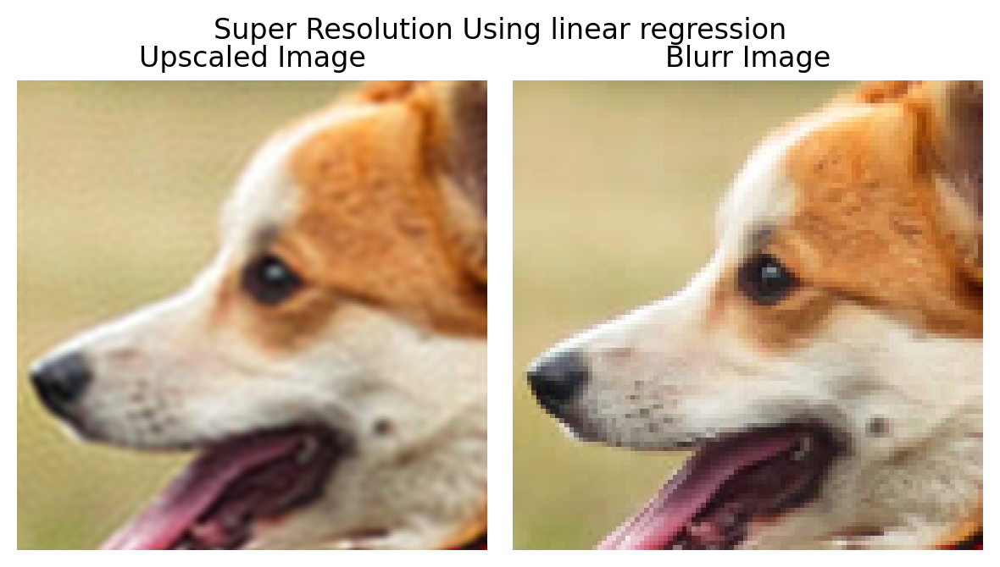

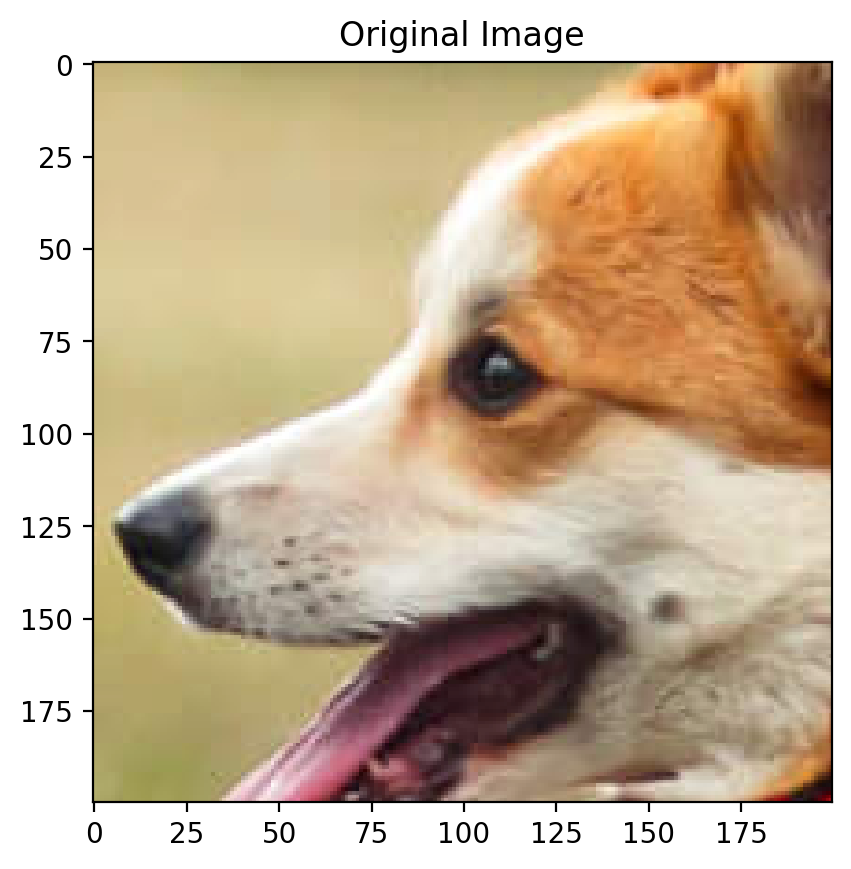

In [22]:
img_linear = plot_reconstructed_and_original_image(resized_tensor, net, X_rff_new,scale ,title="Super Resolution Using linear regression")
plt.figure()
plt.title("Original Image")
plt.imshow(rearrange(img_scaled.cpu(), 'c h w -> h w c').cpu().numpy())
# img_complex = plot_reconstructed_and_original_image(resized_tensor, comp, X_rff_new,scale ,title="Super Resolution Using Neural Network")
# plt.imshow(crop)
plt.show()
del X_rff_new
del X_rff

## Que 2:

The above only helps us with a qualitative comparison. Let us now do a quantitative comparison. Compute the below given metrics: [1 Marks]
RMSE on predicted v/s ground truth high resolution image
Peak SNR on predicted v/s ground truth high resolution image

In [23]:
crop = rearrange(img_scaled.cpu(), 'c h w -> h w c').cpu()

def rmse(original,predicted):

    predicted = predicted.cpu().float()
    ground_truth = original.cpu().float()

    # Compute RMSE
    mse = torch.mean((predicted - ground_truth) ** 2)
    rmse = torch.sqrt(mse)
    
    return rmse.item()

print("RMSE for the upscaled image",rmse(crop,img_linear))

0.025974519550800323


In [24]:
# manually applying the psnr function
def implemented_psnr(img1, img2):

    img1 = img1.to(device)
    img2 = img2.to(device)

    # Calculate the Mean Squared Error (MSE)
    mse = torch.mean((img1 - img2) ** 2)
    
    if mse == 0:
        # MSE is zero means no difference between the images
        return float('inf')

    # Max pixel value is 1 because we have scaled it using min max scaler
    
    max_pixel_value = 1
    psnr_value = 20 * torch.log10(torch.tensor(max_pixel_value) / torch.sqrt(mse))
    
    return psnr_value.item()  # Convert tensor to a Python float for printing


# Using the skimage.metrics.peak_signal_noise_ratio
from skimage.metrics import peak_signal_noise_ratio as psnr
def calculate_psnr(img1, img2):
    
    img1 = img1.detach().cpu().numpy()
    
    img2 = img2.detach().cpu().numpy()

    psnr_value = psnr(img1, img2, data_range=1)

    return psnr_value.item()

# Example usage
# img1 and img2 can be PyTorch tensors or NumPy arrays



# Higher the psnr the better

print("PSNR for the upscaled image by implemented function",implemented_psnr(crop,img_linear))
print("PSNR for the upscaled image by skimage psnr function",calculate_psnr(crop,img_linear))

31.70904965652001
31.70904965652001


# Observations

1) On increasing the value of sigma the fundamental frequency of the rrf features decreases. therefore the bias in the prediction increases and the overfitting decreases. In the following code we can observe that the image getting blurred with increasing the value of sigma.

2) The psnr value and rmse have inverse relation. Higher the psnr the better. In case of rmse lower value is preferred. Initially when sigma is very small the rmse is high and psnr is low indicating that there is distortion in image,which we know due to overfitting the model is unable to generalize well. As we increase the value of sigma the , rmse decreases and psnr increases which suggests that the upscaled image has less distortion. But further increasing the sigma leads to blurring of the image and rmse increases, psnr decreases. This depicts that at higher value of sigma the image has more distortion. Which we know due to high bias when the frequency factor gamma is low in RRF due to higher sigma , leads to blurring of the image.

3) We have also tried implementing the neural network for super resolution. We have used four relu activated hidden layers with output layer as regression layer. We concluded that the neural network performs very well in upscaling. It can even work well with 5000 features whereas in linear regression we have to provide 30000 features for precise results. And due to less number of features Neural Network turns out to be quicker than LinearRegression even though it has 4 hidden layers. Also less features are computationally cheap and memory efficient.

# Wrapping the code in a function

In [61]:
import torch
from sklearn.preprocessing import MinMaxScaler

def upscale(image_url,filename, model, scale,coords = [600,800],showimg = False, n_features=30000, sigma=0.03):

    img_original , blur_image = processImg(image_url,filename,scale,coords,showimg)
    
    blur_image = torch.tensor(blur_image).to(device)

    
    # Create coordinate map for the blurred image
    X_resized, Y_resized = create_coordinate_map(blur_image, 1)

    # MinMaxScaler to scale from -1 to 1
    scaler_X = MinMaxScaler(feature_range=(-1, 1)).fit(X_resized.cpu())

    # Scale the X coordinates
    X_scaled = scaler_X.transform(X_resized.cpu())

    # Move the scaled X coordinates to the GPU
    X_scaled = torch.tensor(X_scaled).to(device).float()

    # Generate RFF features from the scaled X coordinates
    X_rff = create_rff_features(X_scaled, n_features, sigma)

    # Initialize and move the model to the GPU
    net = model(X_rff.shape[1], 3).to(device)

    # Train the model
    print("***********************Patience Brings Prosperity*****************************")
    train(net, 0.005, X_rff, Y_resized, 2500, device,verbose=False)
    
    # Create coordinate map for the scaled image
    X_new, _ = create_coordinate_map(blur_image, scale)  # Assuming resized_tensor is the same as blur_image

    # Scale the X coordinates for the new image
    X_scaled_new = scaler_X.transform(X_new.cpu())
    X_scaled_new = torch.tensor(X_scaled_new).to(device).float()

    # Generate RFF features from the scaled X coordinates for the new image
    X_rff_new = create_rff_features(X_scaled_new, n_features, sigma)
    
    # Set the model to evaluation mode
    net.eval()

    # Temporarily disable gradient calculation to speed up computation and reduce memory usage
    with torch.no_grad():
        # Get the reconstructed output from the model
        outputs = net(X_rff_new)

        # Reshape the output to match the scaled image dimensions
        num_channels, height, width = blur_image.shape
        outputs = outputs.reshape(scale * height, scale * width, num_channels)

    # Create a new figure with a specific size
    fig = plt.figure(figsize=(20, 10))
    
    # Create a GridSpec layout to place subplots in a grid; here, it's a 1x2 grid with equal width ratios
    gs = gridspec.GridSpec(1, 3)
    # display(gs)

    # Define the subplots within the GridSpec layout
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax2 = plt.subplot(gs[2])

    # Display the reconstructed image in the first subplot (ax0)
    # .cpu() moves the tensor to CPU if it's on GPU, which is necessary for matplotlib
    ax0.imshow(outputs.cpu())
    ax0.set_title("Upscaled Image")  # Set the title for the first subplot

    # Display the original image in the second subplot (ax1)
    # .permute(1, 2, 0) changes the channel order to (height, width, num_channels) for proper visualization in matplotlib
    ax1.imshow(blur_image.cpu().permute(1, 2, 0))
    ax1.set_title("Resized Image")  # Set the title for the second subplot
    
    ax2.imshow(rearrange(img_original,'c h w -> h w c').cpu())
    ax2.set_title("Original Image")

    # Turn off the axes for both subplots to improve visualization
    for a in [ax0, ax1,ax2]:
        a.axis("off")

    # Set a super title for the entire figure and adjust the layout to minimize overlap
    fig.suptitle(filename, y=0.9)
    plt.tight_layout()
    plt.show()

    print("RMSE: ",rmse(crop,outputs))
    print("PSNR: ",implemented_psnr(crop,outputs))
    
    
    print("*"*60)
    print("\n\n\n\n\n")
    del X_rff_new
    del X_rff
    return outputs.cpu()


img1 already exists
***********************Patience Brings Prosperity*****************************


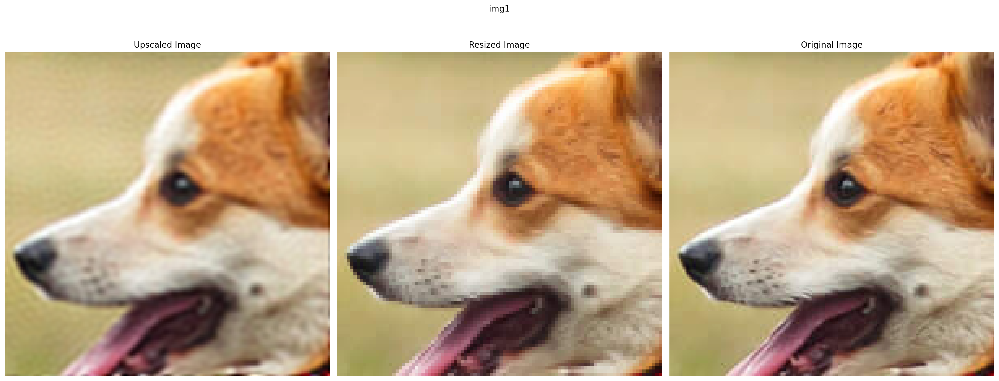

RMSE:  0.032617148011922836
PSNR:  29.731080265955647
************************************************************








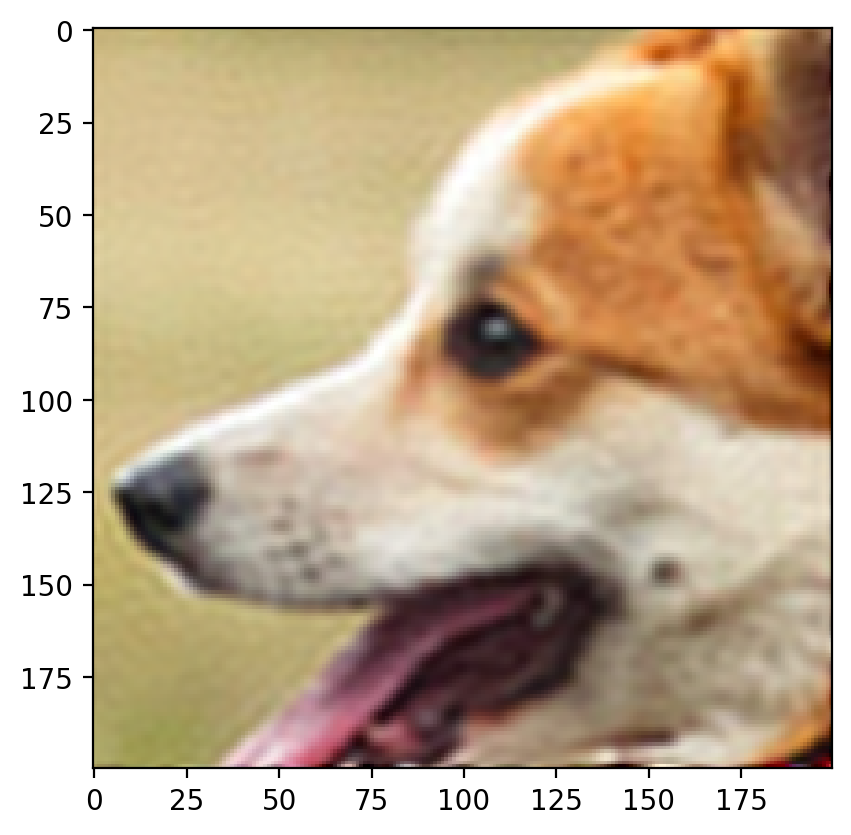

In [62]:
scale = 2
output = upscale(url,"img1",LinearModel,scale, n_features=30000, sigma=0.03)
plt.imshow(output)

Sigma =  0.01
img1 already exists
***********************Patience Brings Prosperity*****************************


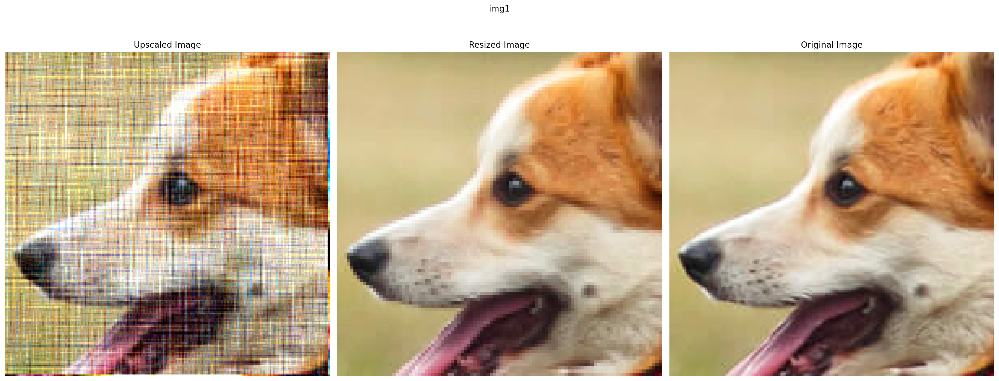

RMSE:  0.13959109783172607
PSNR:  17.102845911207652
************************************************************






Sigma =  0.015
img1 already exists
***********************Patience Brings Prosperity*****************************


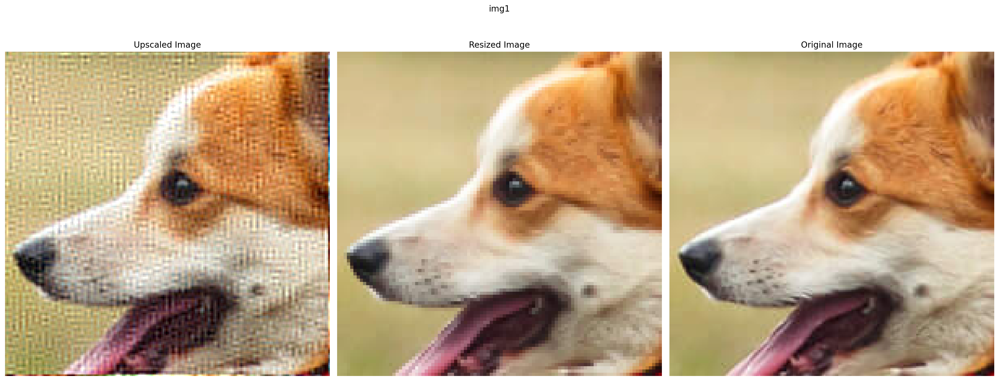

RMSE:  0.07432380318641663
PSNR:  22.57744197434048
************************************************************






Sigma =  0.019999999999999997
img1 already exists
***********************Patience Brings Prosperity*****************************


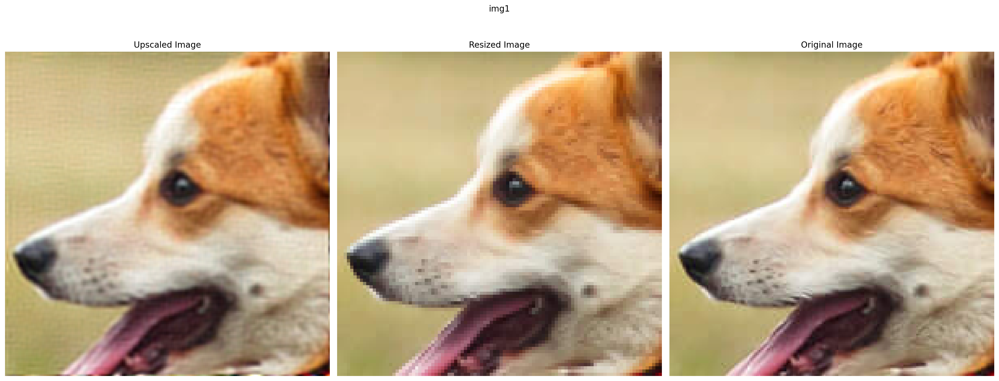

RMSE:  0.03353699669241905
PSNR:  29.48951692020282
************************************************************






Sigma =  0.024999999999999998
img1 already exists
***********************Patience Brings Prosperity*****************************


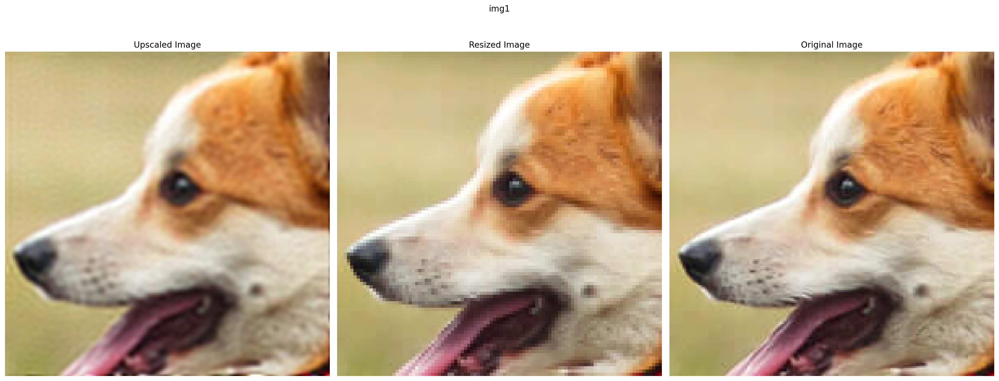

RMSE:  0.032100655138492584
PSNR:  29.869722777882536
************************************************************






Sigma =  0.03
img1 already exists
***********************Patience Brings Prosperity*****************************


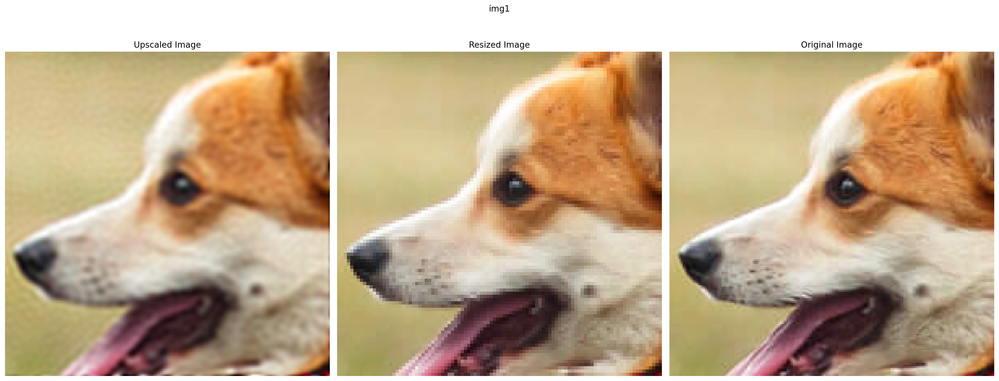

RMSE:  0.032617975026369095
PSNR:  29.730860397501377
************************************************************






Sigma =  0.034999999999999996
img1 already exists
***********************Patience Brings Prosperity*****************************


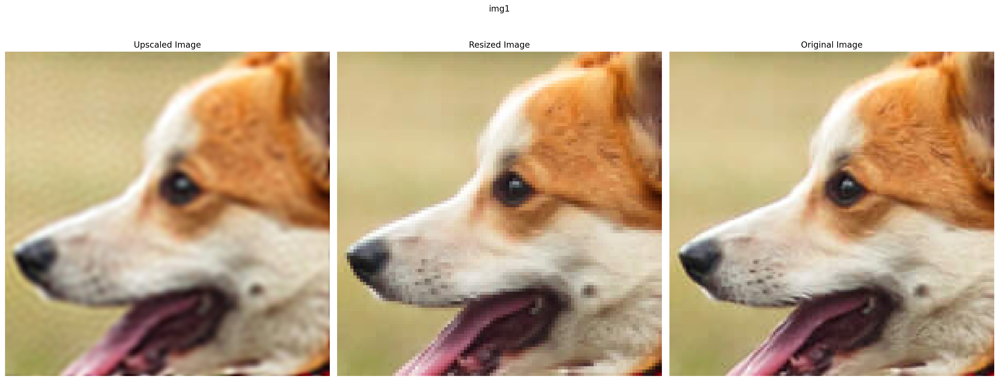

RMSE:  0.03343062847852707
PSNR:  29.517108592723893
************************************************************






Sigma =  0.039999999999999994
img1 already exists
***********************Patience Brings Prosperity*****************************


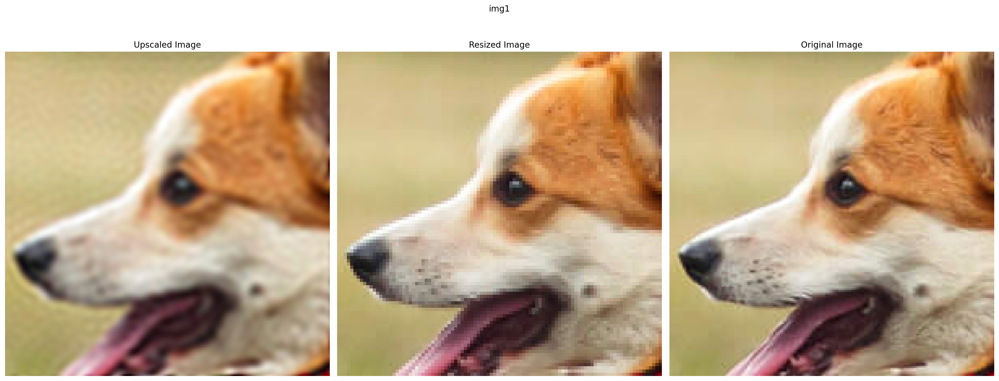

RMSE:  0.034813009202480316
PSNR:  29.165169245125632
************************************************************






Sigma =  0.045
img1 already exists
***********************Patience Brings Prosperity*****************************


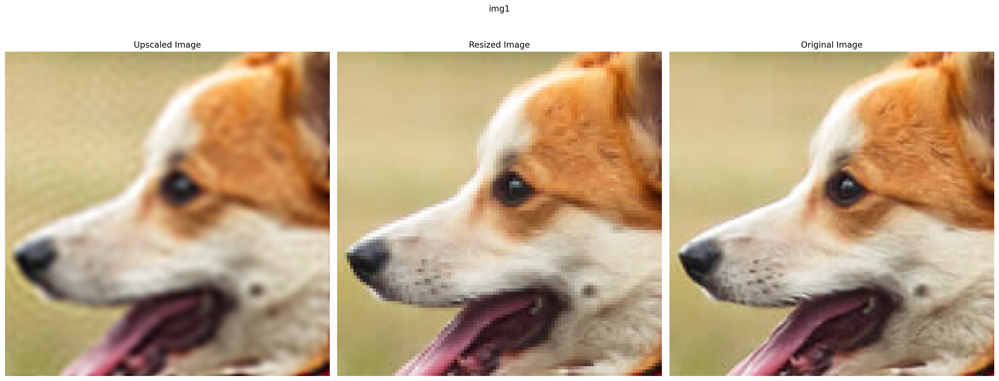

RMSE:  0.035956501960754395
PSNR:  28.884451328616056
************************************************************






Sigma =  0.049999999999999996
img1 already exists
***********************Patience Brings Prosperity*****************************


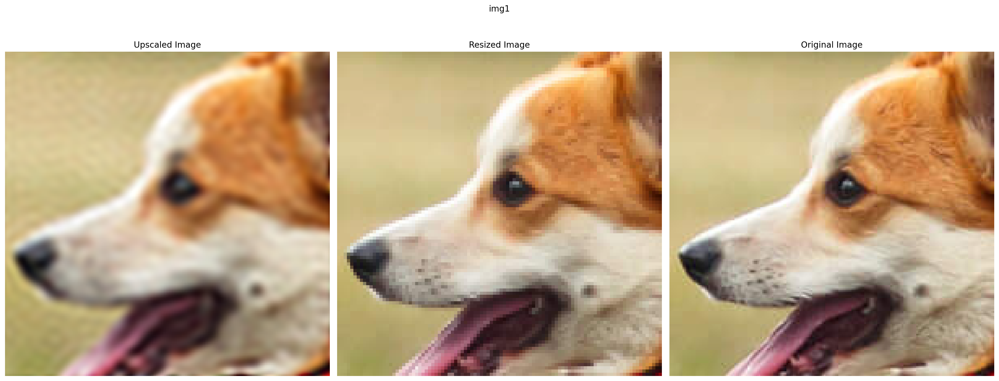

RMSE:  0.03712238371372223
PSNR:  28.60728324555009
************************************************************






Sigma =  0.05499999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


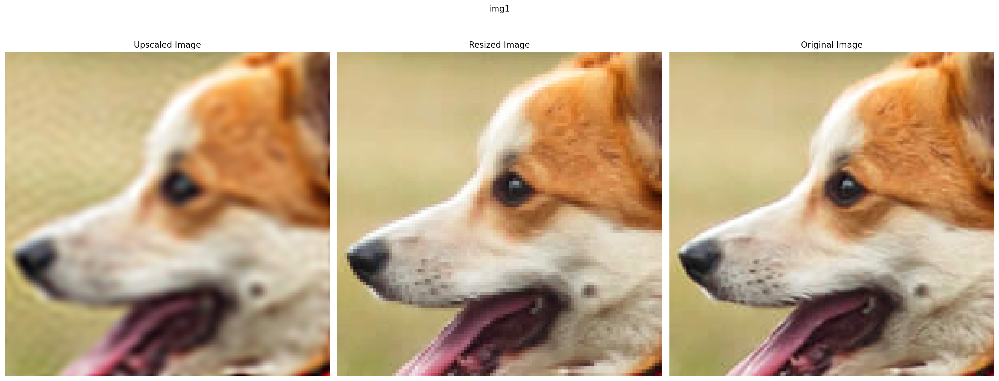

RMSE:  0.03835098817944527
PSNR:  28.324468941357953
************************************************************






Sigma =  0.05999999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


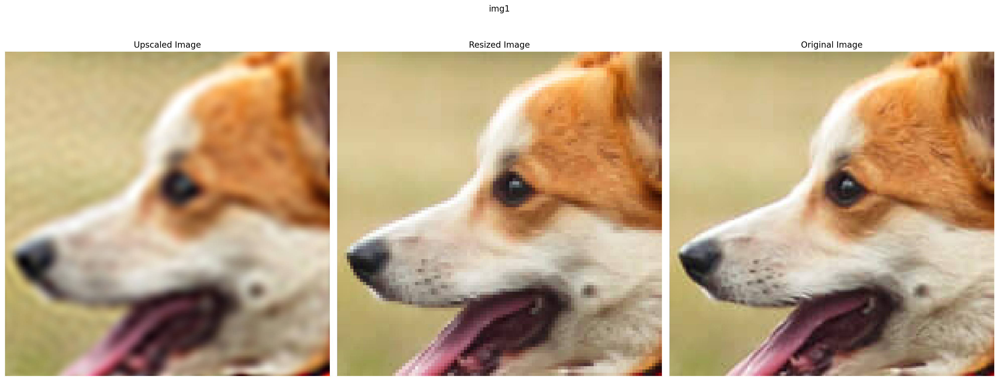

RMSE:  0.039676863700151443
PSNR:  28.029253703341894
************************************************************






Sigma =  0.06499999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


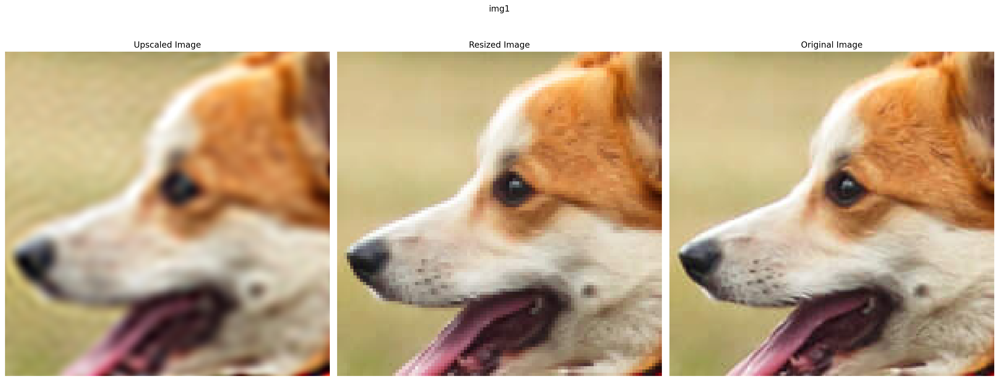

RMSE:  0.04113125056028366
PSNR:  27.71656160240046
************************************************************






Sigma =  0.06999999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


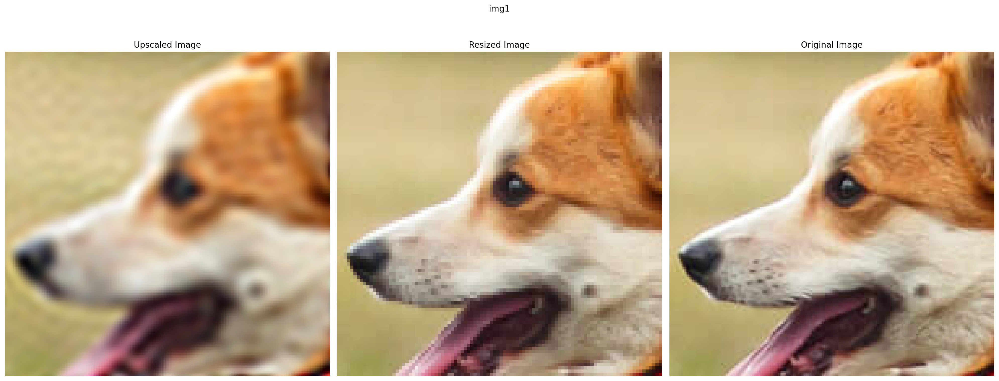

RMSE:  0.04239851236343384
PSNR:  27.452987527376976
************************************************************






Sigma =  0.07499999999999998
img1 already exists
***********************Patience Brings Prosperity*****************************


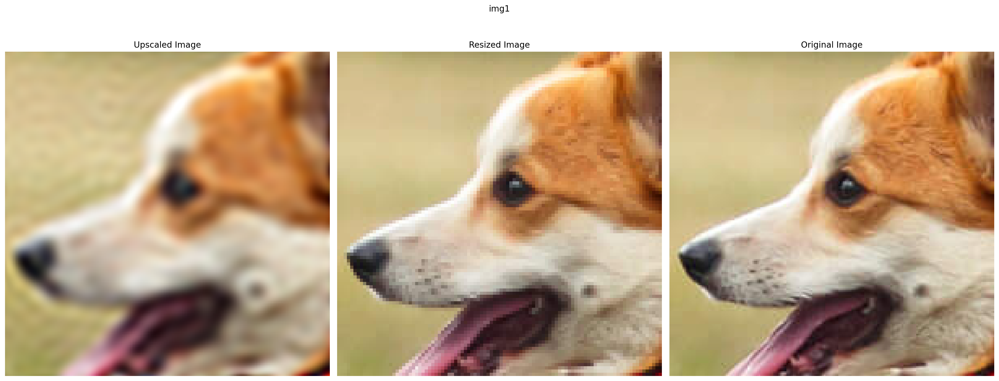

RMSE:  0.04345916956663132
PSNR:  27.23837145411094
************************************************************






Sigma =  0.07999999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


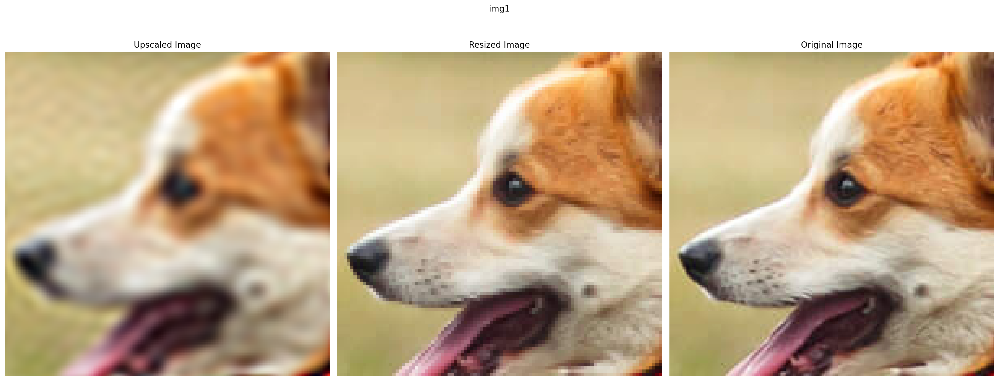

RMSE:  0.04457041248679161
PSNR:  27.019066879708294
************************************************************






Sigma =  0.08499999999999998
img1 already exists
***********************Patience Brings Prosperity*****************************


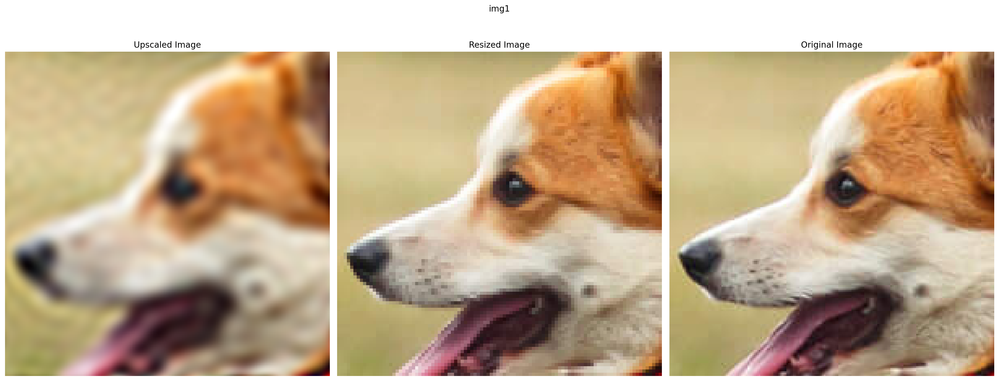

RMSE:  0.046069782227277756
PSNR:  26.731677089778394
************************************************************






Sigma =  0.08999999999999998
img1 already exists
***********************Patience Brings Prosperity*****************************


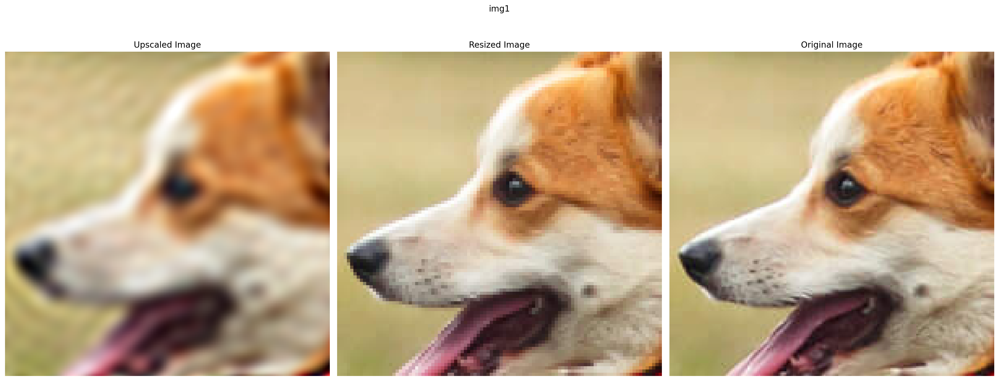

RMSE:  0.04704597592353821
PSNR:  26.549549695192788
************************************************************






Sigma =  0.09499999999999999
img1 already exists
***********************Patience Brings Prosperity*****************************


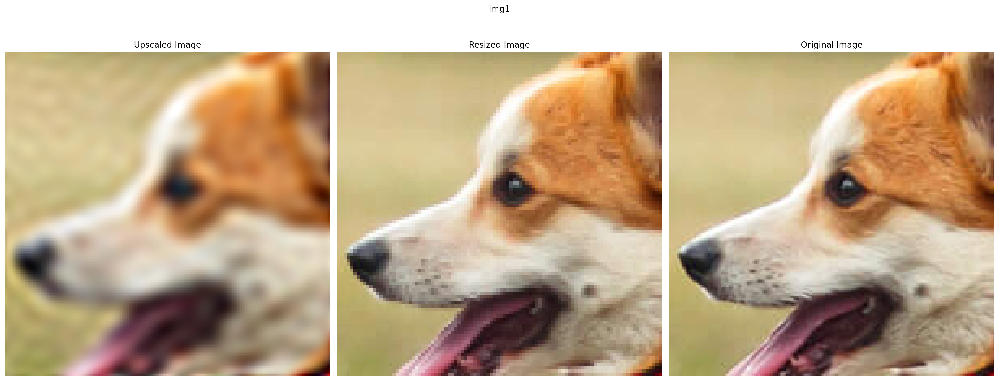

RMSE:  0.04871285334229469
PSNR:  26.247128460961378
************************************************************








In [31]:
for i in np.arange(0.01,0.1,0.005):
    print("Sigma = ",i)
    upscale(url,"img1",LinearModel,scale, n_features=30000, sigma=i)
    

img1 already exists
***********************Patience Brings Prosperity*****************************


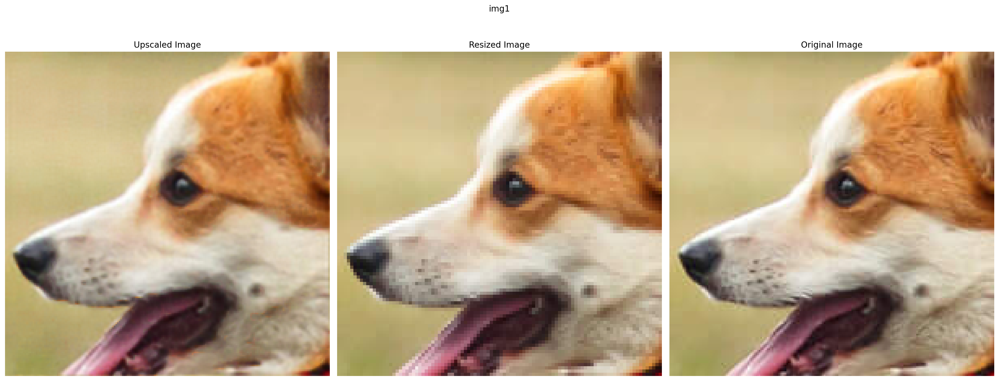

RMSE:  0.028682095929980278
PSNR:  30.847782829148933
************************************************************






using neural network


In [32]:
scale = 2
upscale(url,"img1",ComplexModel,scale,n_features = 30000,sigma = 0.02)
print("using neural network")

img1 already exists
***********************Patience Brings Prosperity*****************************


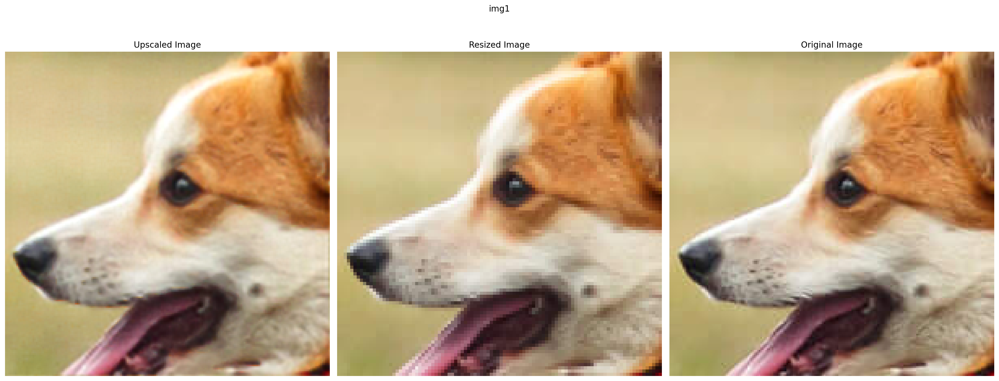

RMSE:  0.030193394050002098
PSNR:  30.40176012221154
************************************************************






using neural network


In [33]:
scale = 2
upscale(url,"img1",ComplexModel,scale,n_features = 30000,sigma = 0.02)
print("using neural network")

Using Linear Model
img4 already exists


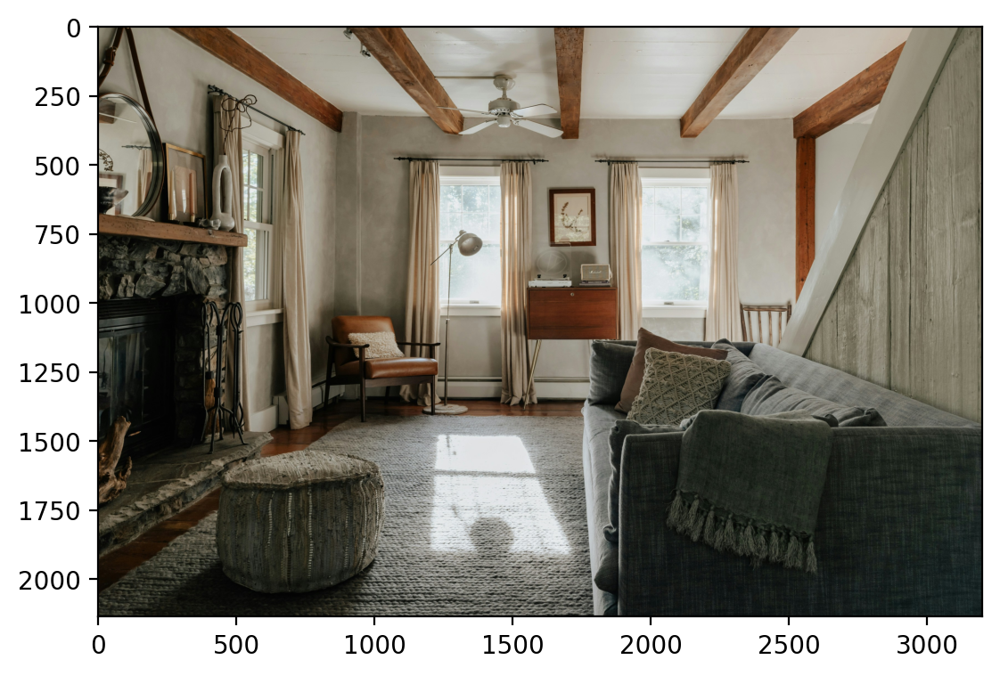

***********************Patience Brings Prosperity*****************************


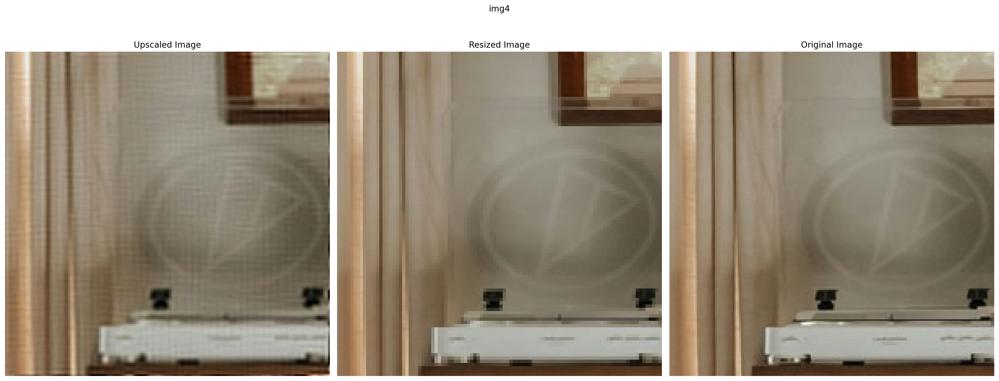

RMSE:  0.27326154708862305
PSNR:  11.268429635058697
************************************************************











Using Linear Model
img4 already exists


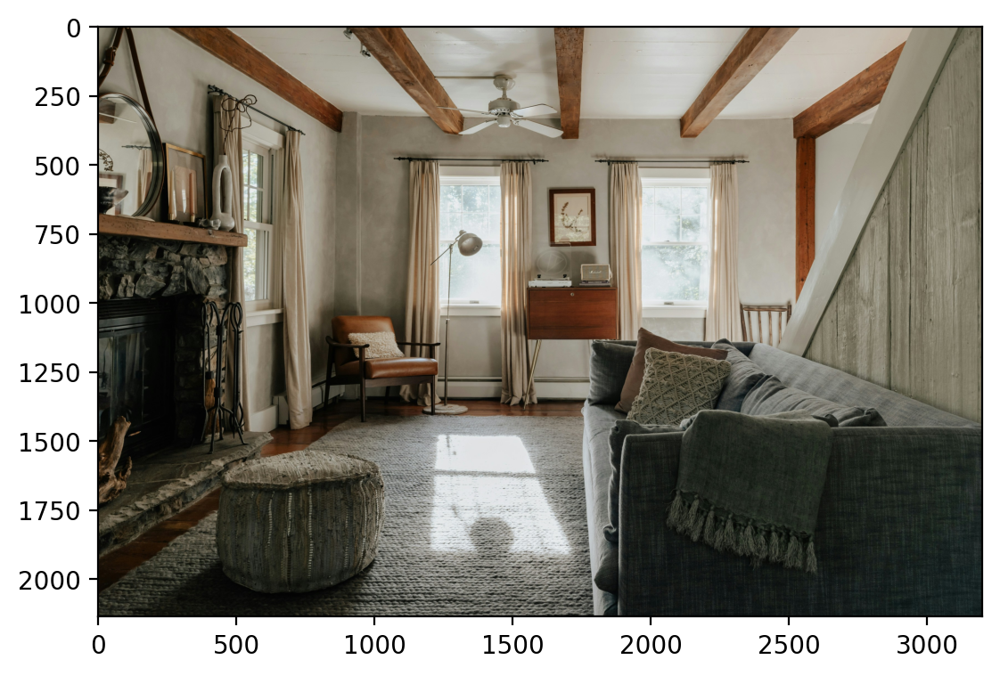

***********************Patience Brings Prosperity*****************************


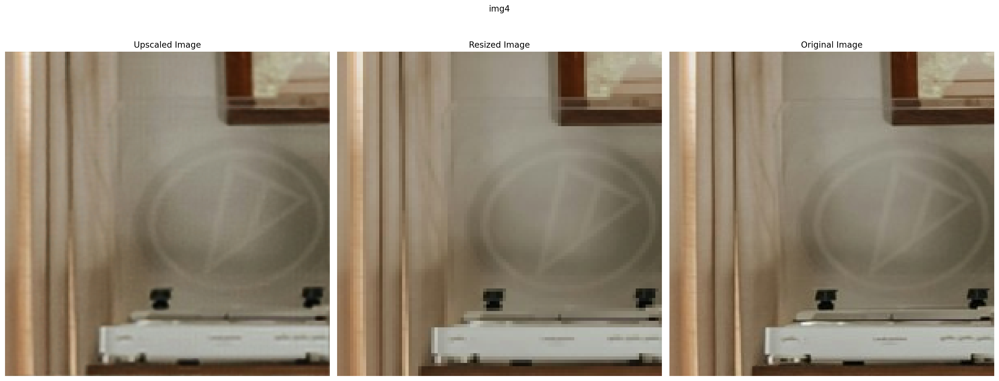

RMSE:  0.2719072997570038
PSNR:  11.311582472682623
************************************************************






****************************************************************************************************


In [66]:
scale = 2
url = "https://images.unsplash.com/photo-1726090401458-7abb00f7450c"
print("Using Linear Model")
upscale(url,"img4",LinearModel,scale,coords=[750,1500],showimg = True,n_features = 30000,sigma = 0.02)
print("\n\n\n\n")
print("Using Linear Model")
upscale(url,"img4",ComplexModel,scale,coords=[750,1500],showimg = True,n_features = 10000,sigma = 0.02)
print("*"*100)